In [161]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import statsmodels.api as sm
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings("ignore")
import matplotlib
warnings.filterwarnings("always")

import os
import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass

warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)

import numpy as np
import pandas as pd
import pylab
import seaborn as sns
sns.set(style="ticks", color_codes=True, font_scale=1.5)
from matplotlib import pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.colors import ListedColormap
%matplotlib inline
import mpl_toolkits
from mpl_toolkits.mplot3d import Axes3D
from graphviz import Source
from IPython.display import Image

from scipy.stats import skew, norm, probplot, boxcox, f_oneway
from scipy import interp
from sklearn.base import BaseEstimator, TransformerMixin, clone, ClassifierMixin
from sklearn import metrics, tree
from sklearn.preprocessing import LabelEncoder, label_binarize, StandardScaler, PolynomialFeatures, MinMaxScaler

from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, cross_val_predict, train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc, accuracy_score

from sklearn.linear_model import LogisticRegression
from keras.models import Sequential
from keras.layers import Dense
from scikeras.wrappers import KerasClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from mlxtend.classifier import StackingClassifier



In [162]:
data = pd.read_csv('winequalityN.csv')
data.head(5)

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


fixed acidity is used to adjust flavour, it should be in a suitable range
volatile acidity indicates the freshness, but it should also be in a range
...



In [163]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [164]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6487.000000,6489.000000,6494.000000,6495.000000,6495.000000,6497.000000,6497.000000,6497.000000,6488.000000,6493.000000,6497.000000,6497.000000
mean,7.216579,0.339691,0.318722,5.444326,0.056042,30.525319,115.744574,0.994697,3.218395,0.531215,10.491801,5.818378
std,1.296750,0.164649,0.145265,4.758125,0.035036,17.749400,56.521855,0.002999,0.160748,0.148814,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


We see there are some outliers that need to deal with

# Define functions for Exploratory Data Analysis

In [165]:
def draw_histogram(col, plot_title, x_label, y_label):
    plt.figure(figsize=(10, 6))
    plt.hist(col, bins=20, color='steelblue', edgecolor='k', alpha=0.7)
    plt.title(plot_title, fontsize=16)
    plt.xlabel(x_label, fontsize=14)
    plt.ylabel(y_label, fontsize=14)
    plt.show()

In [166]:
def draw_boxplot(col): # statistic info
    sns.boxplot(col)

In [167]:
def draw_piechart(col, label):
    plt.figure(figsize=(10, 6))
    #  containing the labels to be displayed for each slice of the pie chart
    plt.pie(col.value_counts(), labels=label, autopct='%.3f', shadow=True, startangle=90) # value counts of unique values in the specified column
    plt.axis('equal')
    plt.show()

In [168]:
def draw_scatterplot(col1, col2):
    plt.scatter(data[col1], data[col2])

In [169]:
def calc_linear_summary(feature, target):
    y = data[target]
    x = data[feature]
    x = sm.add_constant(x) # intercept
    model = sm.OLS(y, x).fit()
    print(model.summary())

In [170]:
def draw_joint_plot(colx, coly):
    sns.jointplot(x=colx, y=coly, data=data, kind='reg')

In [171]:
def handle_outlier(col):
    sorted(col)
    Q1,Q3 = col.quantile([0.25,0.75])
    IQR = Q3 - Q1
    lower_range = Q1 - 1.5 * IQR
    upper_range = Q3 + 1.5 * IQR
    return lower_range, upper_range


In [172]:
def one_hot_encoding(data,cols):
    one_hot_encoded_data = pd.get_dummies(data, columns=cols)
    return one_hot_encoded_data

In [173]:
import pandas as pd

def rstr(df, pred=None):
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: x.unique())
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.nunique())
    missing_ratio = (df.isnull().sum() / obs) * 100
    skewness = df.skew()
    kurtosis = df.kurtosis()
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ratio', 'uniques', 'skewness', 'kurtosis']
        summary = pd.concat([types, counts, distincts, nulls, missing_ratio, uniques, skewness, kurtosis], axis=1)

    else:
        corr = df.corr()[pred]
        corr_col = 'corr_' + pred
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ratio', 'uniques', 'skewness', 'kurtosis', corr_col]
        summary = pd.concat([types, counts, distincts, nulls, missing_ratio, uniques, skewness, kurtosis, corr], axis=1, sort=False)

    summary.columns = cols
    dtypes = summary.types.value_counts()
    print('___________________________\nData types:\n', dtypes)
    print('___________________________')
    return summary

In [174]:
from sklearn.base import TransformerMixin

class DataFrameImputer(TransformerMixin):
    def __init__(self):
        """
        Impute missing values:
        - Columns of dtype object are imputed with the most frequent value in the column.
        - Columns of other types are imputed with the mean of the column.
        """
        pass

    def fit(self, X, y=None):
        self.fill = pd.Series(
            [X[c].value_counts().index[0] if X[c].dtype == 'object' else X[c].mean() for c in X],
            index=X.columns
        )
        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

# EDA

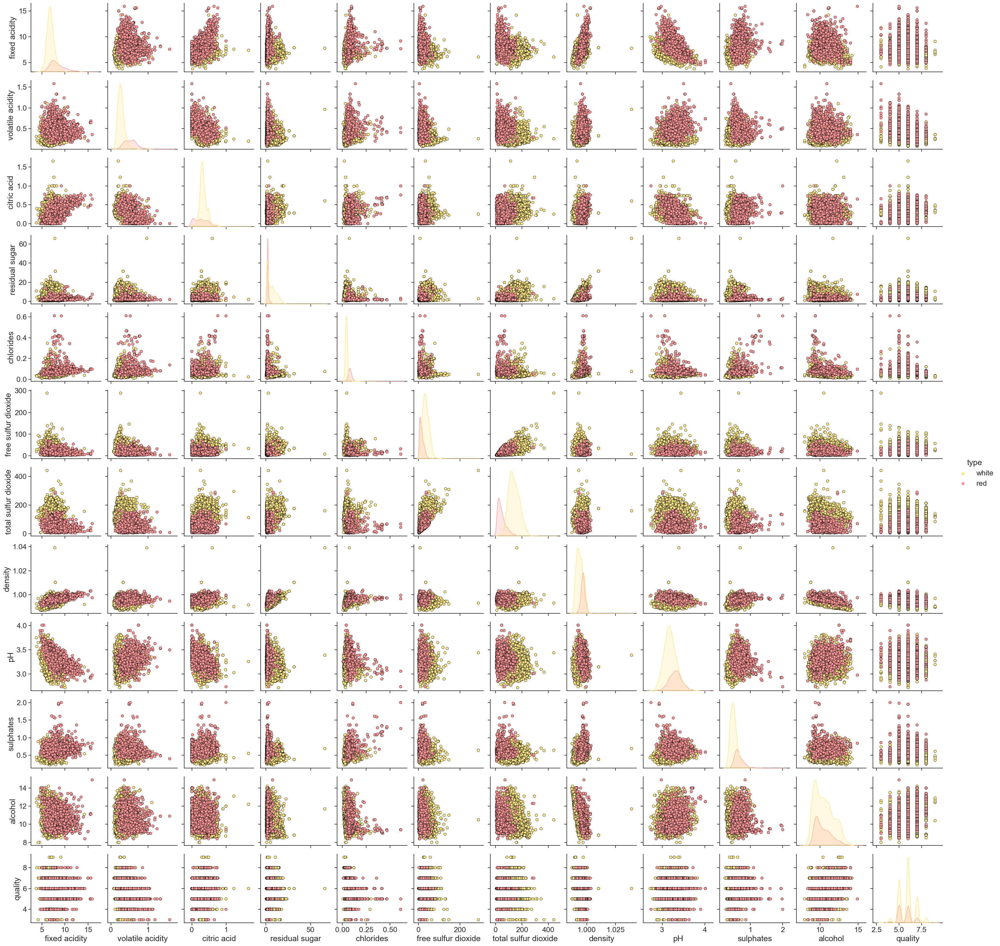

In [175]:
sns.pairplot(data = data, hue='type', palette={'red': '#FF9999', 'white': '#FFE888'},plot_kws=dict(edgecolor='black', linewidth=0.5))

In [176]:
wines = pd.read_csv('winequalityN.csv')
wines['quality_label'] = wines.quality.apply(lambda q: 'low' if q <= 5 else 'medium' if q <= 7 else 'high')

# re-shuffle records just to randomize data points
wines = wines.sample(frac=1, random_state=101).reset_index(drop=True)

In [177]:
wines

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label
0,white,7.3,0.28,0.42,14.4,0.040,49.0,173.0,0.99940,3.28,0.82,9.0,7,medium
1,red,6.9,1.09,0.06,2.1,0.061,12.0,31.0,0.99480,3.51,0.43,11.4,4,low
2,red,9.5,0.46,0.24,2.7,0.092,14.0,44.0,0.99800,3.12,0.74,10.0,6,medium
3,red,8.2,0.31,0.40,2.2,0.058,6.0,10.0,0.99536,3.31,0.68,11.2,7,medium
4,white,7.9,0.28,0.41,4.9,0.058,31.0,153.0,0.99660,3.27,0.51,9.7,6,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,white,6.9,0.19,0.40,1.4,0.036,14.0,55.0,0.99090,3.08,0.68,11.5,7,medium
6493,red,9.3,0.37,0.44,1.6,0.038,21.0,42.0,0.99526,3.24,0.81,10.8,7,medium
6494,white,6.0,0.13,0.28,5.7,0.038,56.0,189.5,0.99480,3.59,0.43,10.6,7,medium
6495,white,6.7,0.30,0.49,4.8,0.034,36.0,158.0,0.99450,3.12,0.45,9.9,6,medium


In [178]:
import pandas as pd

def rstr(df, pred=None):
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: x.unique())
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.nunique())
    missing_ratio = (df.isnull().sum() / obs) * 100
    skewness = df.skew()
    kurtosis = df.kurtosis()
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ratio', 'uniques', 'skewness', 'kurtosis']
        summary = pd.concat([types, counts, distincts, nulls, missing_ratio, uniques, skewness, kurtosis], axis=1)

    else:
        corr = df.corr()[pred]
        corr_col = 'corr_' + pred
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ratio', 'uniques', 'skewness', 'kurtosis', corr_col]
        summary = pd.concat([types, counts, distincts, nulls, missing_ratio, uniques, skewness, kurtosis, corr], axis=1, sort=False)

    summary.columns = cols
    dtypes = summary.types.value_counts()
    print('___________________________\nData types:\n', dtypes)
    print('___________________________')
    return summary

details = rstr(wines, 'quality')

Data shape: (6497, 14)
___________________________
Data types:
 float64    11
object      2
int64       1
Name: types, dtype: int64
___________________________


In [179]:
details

,types,counts,distincts,nulls,missing_ratio,uniques,skewness,kurtosis,corr_quality
type,object,6497,2,0,0.000000,"[white, red]",NaN,NaN,NaN
fixed acidity,float64,6487,106,10,0.153917,"[7.3, 6.9, 9.5, 8.2, 7.9, 9.8, 7.0, 7.2, 6.5, ...",1.722805,5.057727,-0.077031
volatile acidity,float64,6489,187,8,0.123134,"[0.28, 1.09, 0.46, 0.31, 0.34, 0.13, 0.25, 0.3...",1.495512,2.827081,-0.265953
citric acid,float64,6494,89,3,0.046175,"[0.42, 0.06, 0.24, 0.4, 0.41, 0.39, 0.37, 0.28...",0.473032,2.401582,0.085706
residual sugar,float64,6495,316,2,0.030783,"[14.4, 2.1, 2.7, 2.2, 4.9, 1.4, 12.85, 2.0, 13...",1.435000,4.358134,-0.036825
chlorides,float64,6495,214,2,0.030783,"[0.04, 0.061, 0.092, 0.058, 0.066, 0.042, 0.05...",5.399849,50.894874,-0.200886
free sulfur dioxide,float64,6497,135,0,0.000000,"[49.0, 12.0, 14.0, 6.0, 31.0, 3.0, 36.0, 55.0,...",1.220066,7.906238,0.055463
total sulfur dioxide,float64,6497,276,0,0.000000,"[173.0, 31.0, 44.0, 10.0, 153.0, 7.0, 105.0, 2...",-0.001177,-0.371664,-0.041385
density,float64,6497,998,0,0.000000,"[0.9994, 0.9948, 0.998, 0.99536, 0.9966, 0.994...",0.503602,6.606067,-0.305858
pH,float64,6488,108,9,0.138525,"[3.28, 3.51, 3.12, 3.31, 3.27, 3.19, 3.05, 3.3...",0.386966,0.370068,0.019366


## Nulls Check and Cleaning

As you may notice we have very few records with null characteristics, so let's evaluate the option to simply eliminate rows with nulls instead of entering with medians and modes.m

In [180]:
wines.quality_label.value_counts()

medium    3915
low       2384
high       198
Name: quality_label, dtype: int64

In [181]:
wines.dropna().quality_label.value_counts()

missing_val_cols = ["fixed acidity", "pH", "volatile acidity", "sulphates", "citric acid", "residual sugar", "chlorides"]
for col in missing_val_cols:
    mean = df[col].mean()
    df[col].fillna(mean, inplace=True)


medium    3894
low       2372
high       197
Name: quality_label, dtype: int64

As you can notice we will lose only 1 record of high, 12 of low and 21 of medium, out of a total of 34 (0,5%) being safe deletes them.

In [182]:
#wines.dropna(inplace=True)
wines = DataFrameImputer().fit_transform(wines)

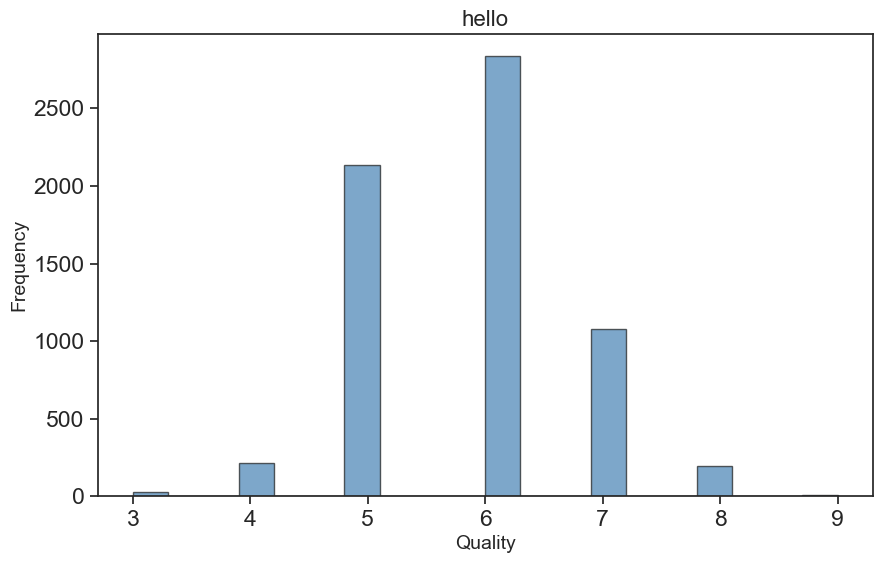

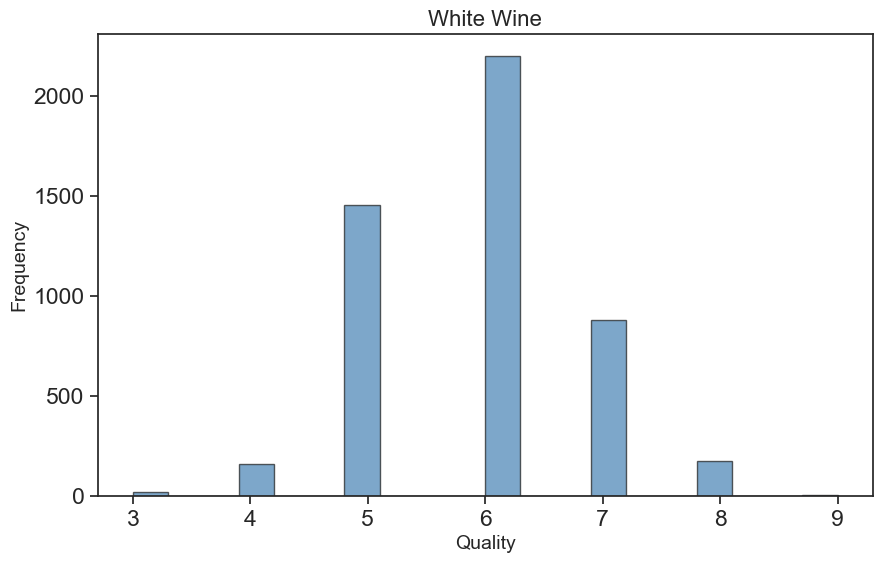

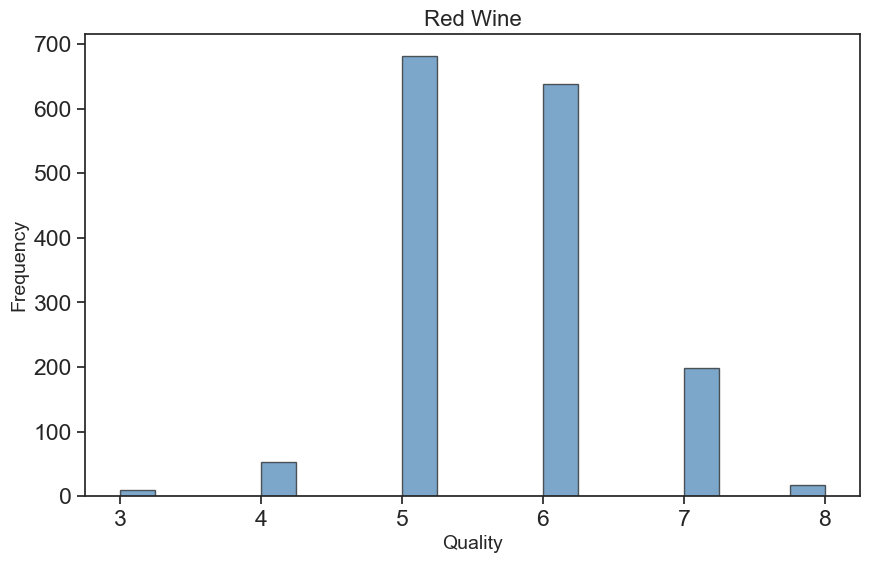

In [183]:
white_wines = wines[wines.type == 'white']
red_wines = wines[wines.type == 'red']

draw_histogram(wines['quality'], 'hello', 'Quality', 'Frequency')
draw_histogram(white_wines['quality'], 'White Wine', 'Quality', 'Frequency')
draw_histogram(red_wines['quality'], 'Red Wine', 'Quality', 'Frequency')

# Descriptive Statistics

## Wine and types

Wine is an alcoholic beverage made from grapes which is fermented without the addition of sugars, acids, enzymes, water, or other nutrients

Red wine is made from dark red and black grapes. The color usually ranges from various shades of red, brown and violet. This is produced with whole grapes including the skin which adds to the color and flavor of red wines, giving it a rich flavor.

White wine is made from white grapes with no skins or seeds. The color is usually straw-yellow, yellow-green, or yellow-gold. Most white wines have a light and fruity flavor as compared to richer red wines.

In [184]:
subset_attributes = wines.columns
rs = round(wines.loc[wines.type == 'red', subset_attributes].describe(),2)
ws = round(wines.loc[wines.type == 'white', subset_attributes].describe(),2)
pd.concat([rs, ws], axis=0, keys=['Red Wine Statistics', 'White Wine Statistics']).T

Red Wine Statistics                                    \
                                   count   mean    std   min    25%    50%   
fixed acidity                     1599.0   8.32   1.74  4.60   7.10   7.90   
volatile acidity                  1599.0   0.53   0.18  0.12   0.39   0.52   
citric acid                       1599.0   0.27   0.19  0.00   0.09   0.26   
residual sugar                    1599.0   2.54   1.41  0.90   1.90   2.20   
chlorides                         1599.0   0.09   0.05  0.01   0.07   0.08   
free sulfur dioxide               1599.0  15.87  10.46  1.00   7.00  14.00   
total sulfur dioxide              1599.0  46.47  32.90  6.00  22.00  38.00   
density                           1599.0   1.00   0.00  0.99   1.00   1.00   
pH                                1599.0   3.31   0.15  2.74   3.21   3.31   
sulphates                         1599.0   0.66   0.17  0.33   0.55   0.62   
alcohol                           1599.0  10.42   1.07  8.40   9.50  10.20   
quality                           1599.0   5.64   0.81  3.00   5.00   6.00   

                                    White Wine Statistics                 \
                        75%     max                 count    mean    std   
fixed acidity          9.20   15.90                4898.0    6.86   0.84   
volatile acidity       0.64    1.58                4898.0    0.28   0.10   
citric acid            0.42    1.00                4898.0    0.33   0.12   
residual sugar         2.60   15.50                4898.0    6.39   5.07   
chlorides              0.09    0.61                4898.0    0.05   0.02   
free sulfur dioxide   21.00   72.00                4898.0   35.31  17.01   
total sulfur dioxide  62.00  289.00                4898.0  138.36  42.50   
density                1.00    1.00                4898.0    0.99   0.00   
pH                     3.40    4.01                4898.0    3.19   0.15   
sulphates              0.73    2.00                4898.0    0.49   0.11   
alcohol               11.10   14.90                4898.0   10.51   1.23   
quality                6.00    8.00                4898.0    5.88   0.89   

                                                            
                       min     25%     50%     75%     max  
fixed acidity         3.80    6.30    6.80    7.30   14.20  
volatile acidity      0.08    0.21    0.26    0.32    1.10  
citric acid           0.00    0.27    0.32    0.39    1.66  
residual sugar        0.60    1.70    5.20    9.90   65.80  
chlorides             0.01    0.04    0.04    0.05    0.35  
free sulfur dioxide   2.00   23.00   34.00   46.00  289.00  
total sulfur dioxide  9.00  108.00  134.00  167.00  440.00  
density               0.99    0.99    0.99    1.00    1.04  
pH                    2.72    3.09    3.18    3.28    3.82  
sulphates             0.22    0.41    0.47    0.55    1.08  
alcohol               8.00    9.50   10.40   11.40   14.20  
quality               3.00    5.00    6.00    6.00    9.00

Highlights from descriptive statisct above:
<ul>
<li>Mean residual sugar and total sulfur dioxide content in white wine seems to be much higher than red wine.</li>
<li>Mean value of sulphates, fixed acidity and volatile acidity seem to be higher in red wine as compared to white wine.</li>
<li>From all numbers, we can observe that citric acid is more present in white than red wines.</li>
<li>In general, white wines has half concentrations of chlorides then red wines.</li>
<li>Although in Ph the difference seems small it is interesting to note that it is slightly larger in green red wines.</li>
</ul>

## By Quality

In [185]:
#subset_attributes = ['alcohol', 'volatile acidity', 'pH', 'quality']
ls = round(wines[wines['quality_label'] == 'low'][subset_attributes].describe(),2)
ms = round(wines[wines['quality_label'] == 'medium'][subset_attributes].describe(),2)
hs = round(wines[wines['quality_label'] == 'high'][subset_attributes].describe(),2)
pd.concat([ls, ms, hs], axis=0, keys=['Low Quality Wine', 'Medium Quality Wine', 'High Quality Wine']).T


Low Quality Wine                                      \
                                count    mean    std   min    25%     50%   
fixed acidity                  2384.0    7.33   1.27  4.20   6.50    7.10   
volatile acidity               2384.0    0.40   0.19  0.10   0.26    0.34   
citric acid                    2384.0    0.30   0.16  0.00   0.21    0.30   
residual sugar                 2384.0    5.65   4.92  0.60   1.80    2.90   
chlorides                      2384.0    0.06   0.04  0.01   0.04    0.05   
free sulfur dioxide            2384.0   29.48  19.84  2.00  14.00   26.00   
total sulfur dioxide           2384.0  119.28  61.89  6.00  68.00  124.00   
density                        2384.0    1.00   0.00  0.99   0.99    1.00   
pH                             2384.0    3.21   0.16  2.74   3.11    3.20   
sulphates                      2384.0    0.52   0.14  0.25   0.44    0.50   
alcohol                        2384.0    9.87   0.84  8.00   9.30    9.60   
quality                        2384.0    4.88   0.36  3.00   5.00    5.00   

                                     Medium Quality Wine          ...          \
                         75%     max               count    mean  ...     75%   
fixed acidity           7.80   15.90              3915.0    7.16  ...    7.60   
volatile acidity        0.50    1.58              3915.0    0.31  ...    0.36   
citric acid             0.40    1.00              3915.0    0.33  ...    0.39   
residual sugar          8.52   23.50              3915.0    5.33  ...    7.90   
chlorides               0.08    0.61              3915.0    0.05  ...    0.06   
free sulfur dioxide    42.00  289.00              3915.0   30.96  ...   41.00   
total sulfur dioxide  167.00  440.00              3915.0  113.51  ...  150.00   
density                 1.00    1.00              3915.0    0.99  ...    1.00   
pH                      3.31    3.90              3915.0    3.22  ...    3.32   
sulphates               0.58    2.00              3915.0    0.54  ...    0.61   
alcohol                10.40   14.90              3915.0   10.81  ...   11.70   
quality                 5.00    5.00              3915.0    6.28  ...    7.00   

                             High Quality Wine                               \
                         max             count    mean    std    min    25%   
fixed acidity          15.60             198.0    6.86   1.14   3.90   6.22   
volatile acidity        1.04             198.0    0.29   0.12   0.12   0.21   
citric acid             1.66             198.0    0.33   0.10   0.03   0.28   
residual sugar         65.80             198.0    5.35   4.16   0.80   2.00   
chlorides               0.42             198.0    0.04   0.02   0.01   0.03   
free sulfur dioxide   112.00             198.0   34.51  17.08   3.00  24.00   
total sulfur dioxide  294.00             198.0  117.48  41.69  12.00  96.00   
density                 1.04             198.0    0.99   0.00   0.99   0.99   
pH                      4.01             198.0    3.23   0.16   2.88   3.13   
sulphates               1.95             198.0    0.51   0.16   0.25   0.38   
alcohol                14.20             198.0   11.69   1.27   8.50  11.00   
quality                 7.00             198.0    8.03   0.16   8.00   8.00   

                                              
                         50%     75%     max  
fixed acidity           6.85    7.30   12.60  
volatile acidity        0.28    0.35    0.85  
citric acid             0.32    0.37    0.74  
residual sugar          4.05    7.57   14.80  
chlorides               0.04    0.04    0.12  
free sulfur dioxide    34.00   43.00  105.00  
total sulfur dioxide  118.50  145.00  212.50  
density                 0.99    0.99    1.00  
pH                      3.23    3.33    3.72  
sulphates               0.48    0.60    1.10  
alcohol                12.00   12.60   14.00  
quality                 8.00    8.00    9.00  

[12 rows x 24 columns]

Highlights from descriptive statisct of quality perspective above:

<ul>
<li>It is interesting how alcohol does not give us much variation to distinguish whether the vine is white or red, but it makes a lot of difference in quality. Note that the higher the quality the higher the average alcohol concentration, increased by about 1% at each level. Although lower quality wines have the lowest standard deviation.</li>
<li>The chlorides and volatile acidity are less present and presented smaller standard deviation in wines of higher quality.</li>
<li>The free sulfur dioxide is higher with higher quality, but their standard deviation decrease with the increase the quality.</li>
<li>Higher quality has less fixed acidity, but the standard deviation is slightly higher in mean quality</li>
</ul>

In [186]:
from scipy.stats import f_oneway

def type_inf_stat_test(feature):
    red_wines = wines[wines.type == 'red'][feature]
    white_wines = wines[wines.type == 'white'][feature]

    F, p = f_oneway(red_wines, white_wines)

    if p <= 0.05:
        msg = 'Reject'
    else:
        msg = 'Accept'

    print('{:20} F Statistic: {:.2f} \t p-value: {:.3f} \t Null Hypothesis: {}'.format(feature, F, p, msg))

In [187]:
print('ANOVA test across wine samples with different types:\n') # determines whether the means of different groups are significantly different from each other.
# - Mean residual sugar and total sulfur dioxide content in white wine seems to be much higher than red wine.
type_inf_stat_test('residual sugar')
type_inf_stat_test('total sulfur dioxide')
#- Mean value of sulphates, fixed acidity and volatile acidity seem to be higher in red wine as compared to white wine.
type_inf_stat_test('sulphates')
type_inf_stat_test('fixed acidity')
type_inf_stat_test('volatile acidity')
#- From all numbers, we can observe that citric acid is more present in white than red wines.
type_inf_stat_test('citric acid')
#- In general, white wines has half concentrations of chlorides then red wines.
type_inf_stat_test('chlorides')
#- Although in Ph the difference seems small it is interesting to note that it is slightly larger in green red wines.
type_inf_stat_test('pH')

ANOVA test across wine samples with different types:

residual sugar       F Statistic: 900.71 	 p-value: 0.000 	 Null Hypothesis: Reject
total sulfur dioxide F Statistic: 6252.80 	 p-value: 0.000 	 Null Hypothesis: Reject
sulphates            F Statistic: 2015.67 	 p-value: 0.000 	 Null Hypothesis: Reject
fixed acidity        F Statistic: 2018.39 	 p-value: 0.000 	 Null Hypothesis: Reject
volatile acidity     F Statistic: 4818.25 	 p-value: 0.000 	 Null Hypothesis: Reject
citric acid          F Statistic: 235.54 	 p-value: 0.000 	 Null Hypothesis: Reject
chlorides            F Statistic: 2314.82 	 p-value: 0.000 	 Null Hypothesis: Reject
pH                   F Statistic: 785.75 	 p-value: 0.000 	 Null Hypothesis: Reject


In [188]:
from scipy.stats import f_oneway

def quality_inf_stat_test(feature):
    F, p = f_oneway(wines[wines.quality_label == 'low'][feature],
                    wines[wines.quality_label == 'medium'][feature],
                    wines[wines.quality_label == 'high'][feature])

    if p <= 0.05:
        msg = 'Reject'
    else:
        msg = 'Accept'

    print('{:20} F Statistic: {:.2f} \t p-value: {:.3f} \t Null Hypothesis: {}'.format(feature, F, p, msg))

In [189]:
print('ANOVA test across wine samples with different levels of quality:\n')
#- alcohol makes a lot of difference in quality. Although lower quality wines have the lowest standard deviation.
quality_inf_stat_test('alcohol')
#- The chlorides and volatile acidity are less present and presented smaller standard deviation in wines of higher quality.
quality_inf_stat_test('chlorides')
quality_inf_stat_test('volatile acidity')
#- The free sulfur dioxide is higher with higher quality, but their standard deviation decrease with the increase the quality.
quality_inf_stat_test('free sulfur dioxide')
#- Higher quality has less fixed acidity, but the standard deviation is slightly higher in mean quality
quality_inf_stat_test('fixed acidity')

ANOVA test across wine samples with different levels of quality:

alcohol              F Statistic: 673.07 	 p-value: 0.000 	 Null Hypothesis: Reject
chlorides            F Statistic: 120.99 	 p-value: 0.000 	 Null Hypothesis: Reject
volatile acidity     F Statistic: 251.29 	 p-value: 0.000 	 Null Hypothesis: Reject
free sulfur dioxide  F Statistic: 10.31 	 p-value: 0.000 	 Null Hypothesis: Reject
fixed acidity        F Statistic: 20.45 	 p-value: 0.000 	 Null Hypothesis: Reject


In [190]:
wines

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label
0,white,7.3,0.28,0.42,14.4,0.040,49.0,173.0,0.99940,3.28,0.82,9.0,7,medium
1,red,6.9,1.09,0.06,2.1,0.061,12.0,31.0,0.99480,3.51,0.43,11.4,4,low
2,red,9.5,0.46,0.24,2.7,0.092,14.0,44.0,0.99800,3.12,0.74,10.0,6,medium
3,red,8.2,0.31,0.40,2.2,0.058,6.0,10.0,0.99536,3.31,0.68,11.2,7,medium
4,white,7.9,0.28,0.41,4.9,0.058,31.0,153.0,0.99660,3.27,0.51,9.7,6,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,white,6.9,0.19,0.40,1.4,0.036,14.0,55.0,0.99090,3.08,0.68,11.5,7,medium
6493,red,9.3,0.37,0.44,1.6,0.038,21.0,42.0,0.99526,3.24,0.81,10.8,7,medium
6494,white,6.0,0.13,0.28,5.7,0.038,56.0,189.5,0.99480,3.59,0.43,10.6,7,medium
6495,white,6.7,0.30,0.49,4.8,0.034,36.0,158.0,0.99450,3.12,0.45,9.9,6,medium


In [191]:
class_tp = LabelEncoder()
y_tp = class_tp.fit_transform(wines.type.values)
wines['color'] = y_tp

class_ql = {'low':0, 'medium': 1, 'high': 2}
y_ql = wines.quality_label.map(class_ql)


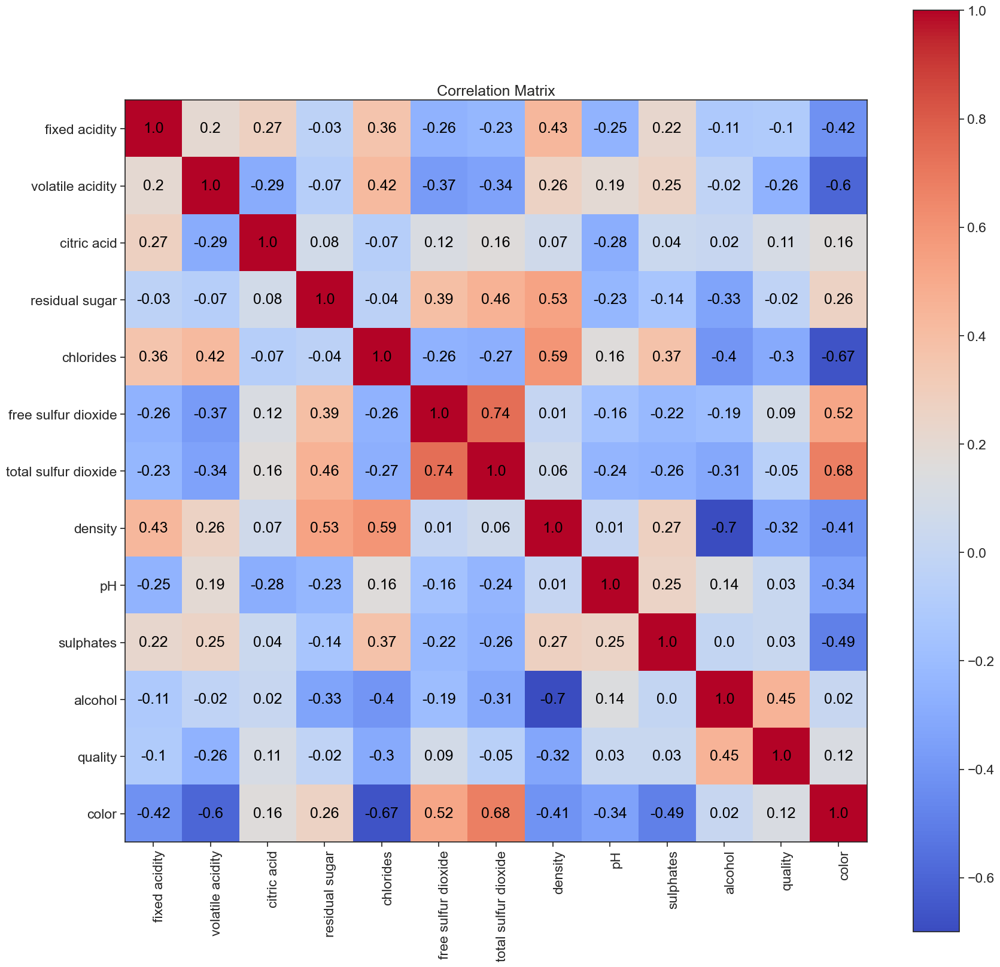

In [192]:
# check the correlation between features

cr = wines.corr(method='spearman').round(2)

# Plot the correlation matrix
fig, ax = plt.subplots(figsize=(20, 20))
im = ax.imshow(cr, cmap='coolwarm')

# Add colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Set tick labels
ax.set_xticks(range(len(cr.columns)))
ax.set_yticks(range(len(cr.index)))
ax.set_xticklabels(cr.columns)
ax.set_yticklabels(cr.index)

# Rotate x-axis tick labels
plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")

# Set title
ax.set_title("Correlation Matrix")

# Display the correlation values in each cell
for i in range(len(cr.index)):
    for j in range(len(cr.columns)):
        text = ax.text(j, i, cr.iloc[i, j], ha="center", va="center", color="black")

plt.show()

While most of the correlations are weak, we can see that:

1. Total and free sulfur dioxide has the higest correlation with white wines and each other. In fact, the second is a parcel of the fisrt and it is represent a colinearity that can be a problamem for linear classifiers, special if the target will predict the color, in that case we need drop the free sulfur dioxide.

2. The residual sugar has a half relation to the total sulfur dioxide and 0.40 with free, it is a god indication that wich more residual sugar more sulfur dioxide is added by the winemaker. The 0.5 indicates that white wine tend to have more residual sugar then red wine.

3. Densite has a relatively high positive correlation to residual sugar and relatively high negative correlation to alcohol.

4. The chlorides and volatile acidity has -0.51 and -0,65 correlations between color, indicate a tendency to red wines classification.

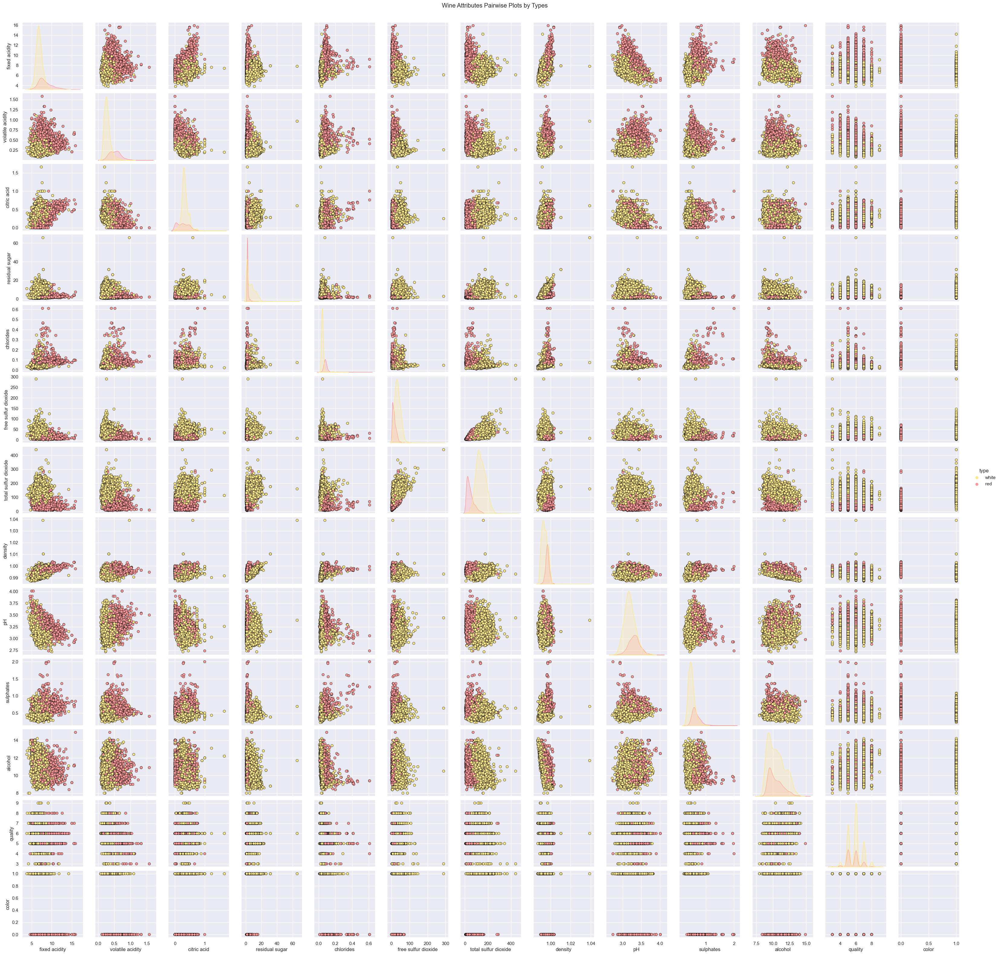

In [193]:
sns.set(font_scale=1.0)
g = sns.pairplot(data = wines, hue='type', palette={'red': '#FF9999', 'white': '#FFE888'},plot_kws=dict(edgecolor='black', linewidth=0.5))
fig = g.fig
fig.subplots_adjust(top=0.96, wspace=0.2)
t = fig.suptitle('Wine Attributes Pairwise Plots by Types')

Again it is in alignment with the insights we obtained earlier at ANOVA test and correlations

Lower sulphate levels in wines with high quality ratings, but the higest are found in the medium quality
Lower levels of volatile acids in wines with high quality ratings
The higest correlation, 0,72, is see between total and free sulfur dioxide, which is expected, but the two measures have low correlation and in opposite directions with the quality,. So, we will treat this if necessary when we check the multicollinearity.

Again it is in alignment with the insights we obtained earlier at ANOVA test and correlations

Lower sulphate levels in wines with high quality ratings, but the higest are found in the medium quality
Lower levels of volatile acids in wines with high quality ratings

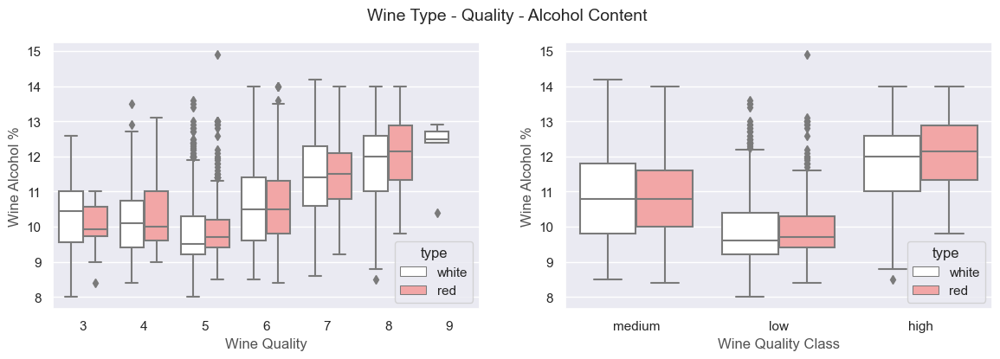

In [194]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
f.suptitle('Wine Type - Quality - Alcohol Content', fontsize=14)

sns.boxplot(x='quality', y='alcohol', hue='type', data=wines, palette={"red": "#FF9999", "white": "white"}, ax=ax1)
ax1.set_xlabel("Wine Quality",size = 12,alpha=0.8)
ax1.set_ylabel("Wine Alcohol %",size = 12,alpha=0.8)

sns.boxplot(x='quality_label', y='alcohol', hue='type', data=wines, palette={"red": "#FF9999", "white": "white"}, ax=ax2)
ax2.set_xlabel("Wine Quality Class",size = 12,alpha=0.8)
ax2.set_ylabel("Wine Alcohol %",size = 12,alpha=0.8)
plt.show()

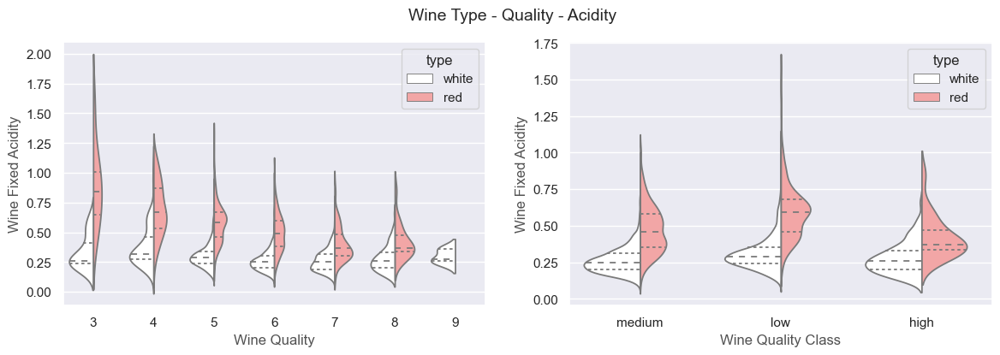

In [195]:
# Let's see visualizing relationships between wine types, quality and acidity:

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
f.suptitle('Wine Type - Quality - Acidity', fontsize=14)

sns.violinplot(x='quality', y='volatile acidity', hue='type', data=wines, split=True, inner='quart', linewidth=1.3,
               palette={'red': '#FF9999', 'white': 'white'}, ax=ax1)
ax1.set_xlabel("Wine Quality",size = 12,alpha=0.8)
ax1.set_ylabel("Wine Fixed Acidity",size = 12,alpha=0.8)

sns.violinplot(x='quality_label', y='volatile acidity', hue='type', data=wines, split=True, inner='quart', linewidth=1.3,
               palette={'red': '#FF9999', 'white': 'white'}, ax=ax2)
ax2.set_xlabel("Wine Quality Class",size = 12,alpha=0.8)
ax2.set_ylabel("Wine Fixed Acidity",size = 12,alpha=0.8)
plt.show()

It is quite evident that red wine samples have higher acidity as compared to its white wine counterparts. Also we can see an overall decrease in acidity with higher quality wine for red wine samples but not so much for white wine samples.

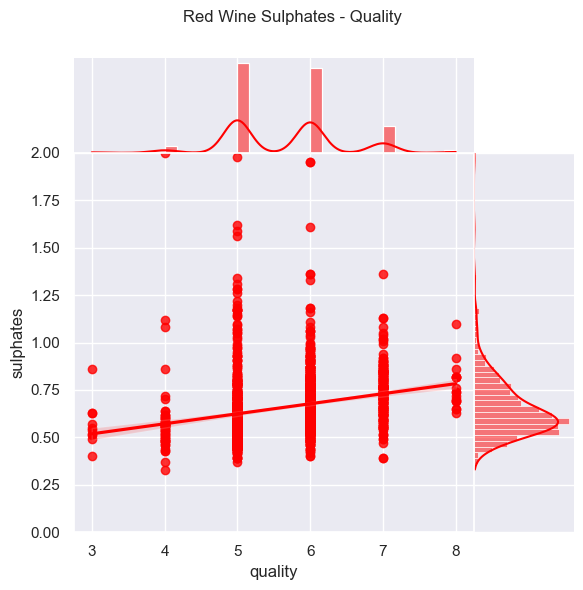

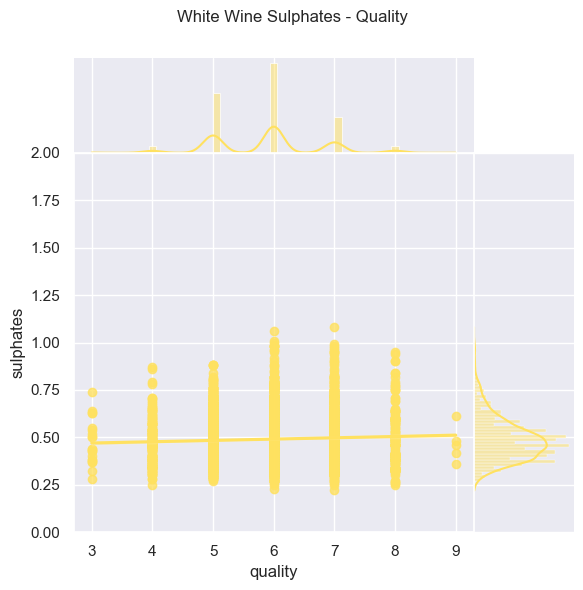

In [196]:
r = sns.jointplot(x='quality', y='sulphates', data=wines[wines.color == 0], # , ax = ax
                  kind='reg', ylim=(0, 2), color='red', space=0, ratio=4)
r.ax_joint.set_xticks(list(range(3,9)))
rfig = r.fig
rfig.subplots_adjust(top=0.9)
t = rfig.suptitle('Red Wine Sulphates - Quality', fontsize=12)

w = sns.jointplot(x='quality', y='sulphates', data=wines[wines.color == 1],
                   kind='reg', ylim=(0, 2), color='#FFE160', space=0, ratio=4)
w.ax_joint.set_xticks(list(range(3,10)))
wfig = w.fig
wfig.subplots_adjust(top=0.9)
t = wfig.suptitle('White Wine Sulphates - Quality', fontsize=12)

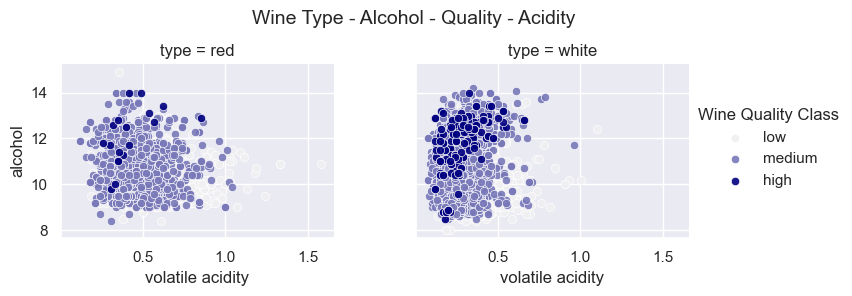

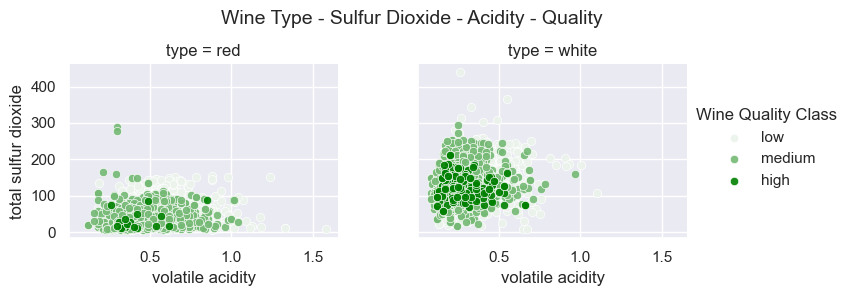

In [197]:
g = sns.FacetGrid(wines, col='type', hue='quality_label', col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
                  aspect=1.2, palette=sns.light_palette('navy', 3))
g.map(plt.scatter, 'volatile acidity', 'alcohol', alpha=0.9, edgecolor='white', linewidth=0.5)
fig = g.fig
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Alcohol - Quality - Acidity', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

g = sns.FacetGrid(wines, col='type', hue='quality_label', col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
                  aspect=1.2, palette=sns.light_palette('green', 3))
g.map(plt.scatter, "volatile acidity", "total sulfur dioxide", alpha=0.9, edgecolor='white', linewidth=0.5)
fig = g.fig
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Sulfur Dioxide - Acidity - Quality', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

# Data Engineering - Cleaning, Transforming, Selection and Reduction

Box cox transformation of highly skewed features： transform non-normal data distribution into a normal shape.

In [198]:
numeric_features = list(wines.dtypes[(wines.dtypes != "str") & (wines.dtypes !='object')].index)
numeric_features.remove('color')

skewed_features = wines[numeric_features].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness = pd.DataFrame({'Skew' :skewed_features})

# Get only higest skewed features
skewness = skewness[abs(skewness) > 0.7]
skewness = skewness.dropna()
print ("There are {} higest skewed numerical features to box cox transform".format(skewness.shape[0]))

l_opt = {}

for feat in skewness.index:
    print(feat)
    wines[feat], l_opt[feat] = boxcox((wines[feat]+1))

skewed_features2 = wines[skewness.index].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness2 = pd.DataFrame({'New Skew' :skewed_features2})
display(pd.concat([skewness, skewness2], axis=1).sort_values(by=['Skew'], ascending=False))

There are 6 higest skewed numerical features to box cox transform
chlorides
sulphates
fixed acidity
volatile acidity
residual sugar
free sulfur dioxide


,Skew,New Skew
chlorides,5.399433,0.188574
sulphates,1.798605,0.009935
fixed acidity,1.723733,-0.063260
volatile acidity,1.496087,0.112905
residual sugar,1.434889,0.136183
free sulfur dioxide,1.219784,-0.036864


# Multi Collinearity

PCA would help. However, it may easy to lose the interpretability of the features.

In [199]:
def pca_analysis(df, y_train, feat):
    # Standardize the data using StandardScaler
    scaler = StandardScaler()
    df_scaled = pd.DataFrame(scaler.fit_transform(df), index=df.index)

    # Perform PCA analysis
    pca = PCA(random_state=101, whiten=True)
    pca.fit(df_scaled)

    # Store results of PCA in a data frame
    pca_result = pd.DataFrame(pca.transform(df_scaled),
                              columns=['PCA%i' % i for i in range(df.shape[1])],
                              index=df.index)

    # Plot the PCA results
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(pca_result['PCA0'], pca_result['PCA1'], pca_result['PCA2'],
               c=y_train, cmap="Set2_r", s=60)

    # Create axis lines
    xAxisLine = ((min(pca_result['PCA0']), max(pca_result['PCA0'])), (0, 0), (0, 0))
    ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
    yAxisLine = ((0, 0), (min(pca_result['PCA1']), max(pca_result['PCA1'])), (0, 0))
    ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
    zAxisLine = ((0, 0), (0, 0), (min(pca_result['PCA2']), max(pca_result['PCA2'])))
    ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')

    # Label the axes and set the title
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    ax.set_title("PCA on the Wines dataset for " + feat)
    plt.show()

    # Split the data into training and test sets
    X_train, X_test, y, y_test = train_test_split(df_scaled, y_train, test_size=0.3, random_state=0)

    # Train and evaluate the K-Nearest Neighbors Classifier
    KNC = KNeighborsClassifier(algorithm='ball_tree', leaf_size=12, n_neighbors=12, p=1, weights='distance')
    KNC.fit(X_train, y)
    print('KNeighbors Classifier Training Accuracy: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train))))
    y_pred = KNC.predict(X_test)
    print('KNeighbors Classifier Test Accuracy: {:2.2%}'.format(accuracy_score(y_test, y_pred)))

    print('_' * 40)
    print('\nAccuracy on', feat, 'Prediction By Number of PCA Components:\n')
    AccPca = pd.DataFrame(columns=['Components', 'Var_ratio', 'Train_Acc', 'Test_Acc'])

    for components in np.arange(1, df.shape[1]):
        # Perform PCA with a specific number of components
        pca = PCA(n_components=components, random_state=101, whiten=True)
        X_train_pca = pca.fit_transform(X_train)
        Components = X_train_pca.shape[1]

        # Train and evaluate the K-Nearest Neighbors Classifier with PCA-transformed data
        KNC = KNeighborsClassifier(algorithm='ball_tree', leaf_size=12, n_neighbors=12, p=1, weights='distance')
        KNC.fit(X_train_pca, y)
        Training_Accuracy = accuracy_score(y, KNC.predict(X_train_pca))
        X_test_pca = pca.transform(X_test)
        y_pred = KNC.predict(X_test_pca)
        Test_Accuracy = accuracy_score(y_test, y_pred)

        # Append the results to the AccPca DataFrame
        AccPca = AccPca.append(pd.DataFrame([(Components, pca.explained_variance_ratio_.sum() * 100,
                                              Training_Accuracy, Test_Accuracy)],
                                            columns=['Components', 'Var_ratio', 'Train_Acc', 'Test_Acc']))

    AccPca.set_index('Components', inplace=True)
    display(AccPca.sort_values(by='Test_Acc', ascending=False))

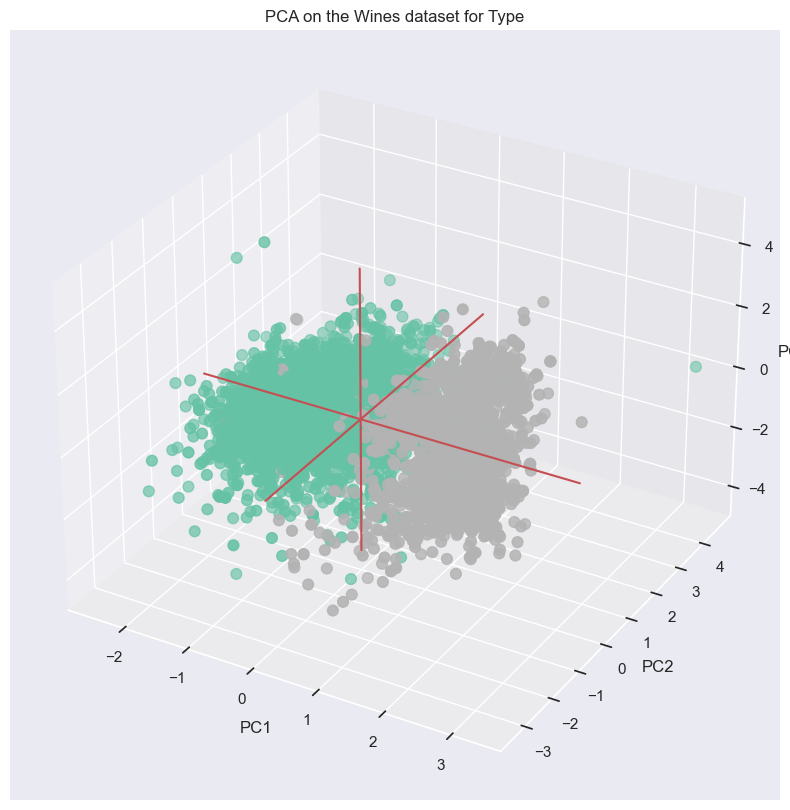

KNeighbors Classifier Training Accuracy: 99.98%
KNeighbors Classifier Test Accuracy: 99.54%
________________________________________

Accuracy on Type Prediction By Number of PCA Components:



,Var_ratio,Train_Acc,Test_Acc
Components,,,
7,87.641060,0.99978,0.994359
9,95.117688,0.99978,0.994359
11,99.392672,0.99978,0.993846
6,82.771116,0.99978,0.993333
8,91.803973,0.99978,0.992821
10,97.649807,0.99978,0.991795
4,70.282419,0.99978,0.990769
5,77.519542,0.99978,0.988718
3,60.918851,0.99978,0.988205


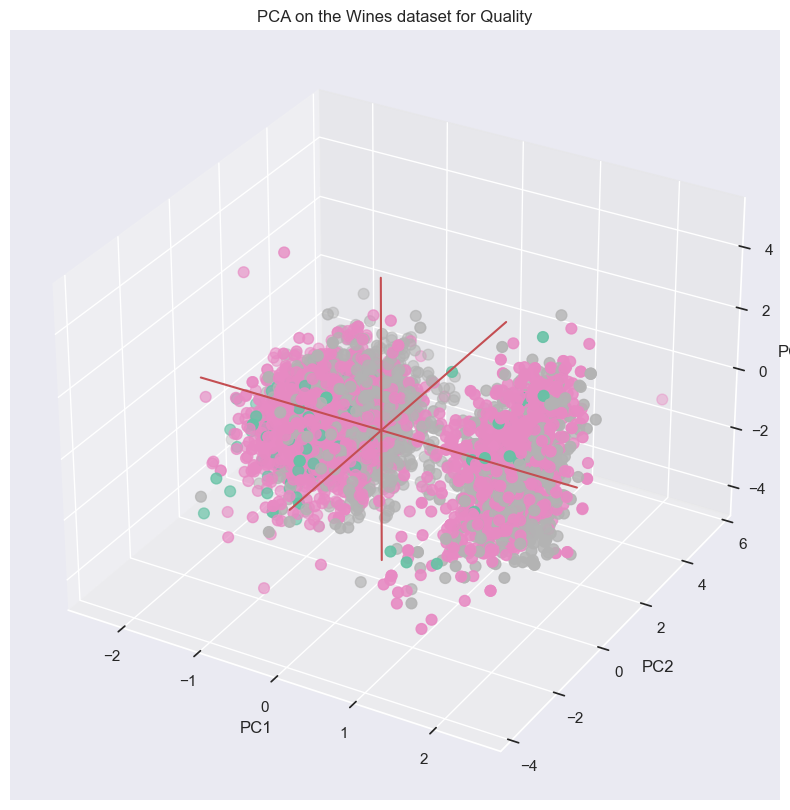

KNeighbors Classifier Training Accuracy: 100.00%
KNeighbors Classifier Test Accuracy: 80.97%
________________________________________

Accuracy on Quality Prediction By Number of PCA Components:



,Var_ratio,Train_Acc,Test_Acc
Components,,,
10,98.558223,1.0,0.810256
9,96.544430,1.0,0.800513
8,93.525628,1.0,0.794359
11,99.445134,1.0,0.794359
6,85.579786,1.0,0.789744
7,90.011438,1.0,0.789231
5,80.424465,1.0,0.784103
4,74.402651,1.0,0.780000
3,66.007086,1.0,0.745128


In [200]:
cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
pca_analysis(wines.loc[:, cols], y_tp, 'Type')

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
pca_analysis(wines.loc[:, cols], y_ql, 'Quality') # overfitting

LDA在样本分类信息依赖方差而不是均值，效果不好
LDA可能过度拟合数据


# Model

We are exploring various approaches to implement classifier models and utilizing techniques such as hyperparameter tuning, cross-validation, and comparing results using different error measures.

To begin, we will create some support functions that will assist us in evaluating our models consistently. Then, we will proceed with classifying wine types and subsequently wine quality labels. For the wine quality classification, we will conclude by employing a stacking approach to enhance the model's performance.

In [ ]:
wines

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Input

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from tensorflow.python.keras.utils.vis_utils import plot_model
import pydot

from scipy.stats import norm
from scipy import stats

from sklearn.model_selection import train_test_split

In [214]:
wines

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label,color
0,white,0.591998,0.158086,0.42,1.611438,0.025720,10.330361,173.0,0.99940,3.28,0.272912,9.0,7,medium,1
1,red,0.590386,0.240648,0.06,0.896790,0.032137,4.723526,31.0,0.99480,3.51,0.216543,11.4,4,low,0
2,red,0.598116,0.197081,0.24,1.001777,0.037427,5.175226,44.0,0.99800,3.12,0.265321,10.0,6,medium,0
3,red,0.594968,0.166489,0.40,0.916219,0.031399,3.063828,10.0,0.99536,3.31,0.258618,11.2,7,medium,0
4,white,0.594065,0.158086,0.41,1.243377,0.031399,8.098480,153.0,0.99660,3.27,0.233151,9.7,6,medium,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,white,0.590386,0.126056,0.40,0.730138,0.024102,5.175226,55.0,0.99090,3.08,0.258618,11.5,7,medium,1
6493,red,0.597699,0.180718,0.44,0.784233,0.024930,6.532387,42.0,0.99526,3.24,0.272037,10.8,7,medium,0
6494,white,0.585840,0.097077,0.28,1.301268,0.024930,11.072430,189.5,0.99480,3.59,0.216543,10.6,7,medium,1
6495,white,0.589496,0.163794,0.49,1.235351,0.023234,8.777457,158.0,0.99450,3.12,0.221049,9.9,6,medium,1


In [237]:
df = wines.drop(['color','quality_label'],axis=1)
df['type'] = df['type'].apply(lambda x:0 if (x == 'white') else 1)

In [238]:
#Create the train and test data. 80% tain and 20 data.
train, test = train_test_split(df, test_size=0.2, random_state = 1)

#From the train Data we are going to get a 20% more to create the validation data.
train, val = train_test_split(train, test_size=0.2, random_state = 1)

In [239]:
def get_labels(df):
    type_wine = df.pop('type')
    type_wine = np.array(type_wine)
    quality = df.pop('quality')
    quality = np.array(quality)
    return (quality, type_wine)

In [240]:
#Getting the labels for train, test and validate.
train_y = get_labels(train)
test_y = get_labels(test)
val_y = get_labels(val)

In [241]:
train_stats = train.describe()
train_stats = train_stats.transpose()

# Normalize the data, but with the mean and std of only train data.
def scale_data(df):
    return (df - train_stats['mean']) / train_stats['std']

#Scaling the 3 datasets.
train_X = scale_data(train)
test_X = scale_data(test)
val_X = scale_data(val)

In [242]:
#Start with the input layer, where we must indicate the shape of the Data passed to the model.
inputs = tf.keras.layers.Input(shape=(11,))

#Add dense layers to the input layer. These layers are commom to both predicted variables.
x = Dense(units=32, activation='relu')(inputs)
x = Dense(units=32, activation='relu')(x)

#Add the output layer for the Wine type using Sigmoid activation.
y_t_layer = Dense(units = 1, activation='sigmoid', name='y_t_layer')(x)

#Here we diversificate the model adding a new Dense layer to the Base layers (x)
quality_layer=Dense(units=64, name='quality_layer', activation='relu')(x)

#The output layer for the quality wine variable. It's added below the Dense Layer: quality_layer
y_q_layer = Dense(units=1, name='y_q_layer')(quality_layer)

#The Model is created indicating the inputs and outputs.
#We have only one Input, but we can create models with multiple inputs.
#The name in outputs is the same of the variables, and the internal name of the layer.
model = Model(inputs=inputs, outputs=[y_q_layer, y_t_layer])

#I tested two optimizers and choosed Adam, but feel free to test yourself.
optimizer = tf.keras.optimizers.legacy.RMSprop(learning_rate=0.0001)
#optimizer = tf.keras.optimizers.Adam()

#To compile the model we use two dictionaries, to indicate the loss functions and metrics
#for each output layer. Note that the name of the layer must be the same than the
#internal name of the layer.
model.compile(optimizer=optimizer,
              loss = {'y_t_layer' : 'binary_crossentropy',
                      'y_q_layer' : 'mse'
                     },
              metrics = {'y_t_layer' : 'accuracy',
                         'y_q_layer': tf.keras.metrics.RootMeanSquaredError()
                       }
             )

In [243]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 11)]                 0         []                            
                                                                                                  
 dense_8 (Dense)             (None, 32)                   384       ['input_5[0][0]']             
                                                                                                  
 dense_9 (Dense)             (None, 32)                   1056      ['dense_8[0][0]']             
                                                                                                  
 quality_layer (Dense)       (None, 64)                   2112      ['dense_9[0][0]']             
                                                                                            

In [244]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [245]:
train_X = np.asarray(train_X).astype(np.float32)

history = model.fit(train_X, train_y,
                    epochs = 40, validation_data=(val_X, val_y))

Epoch 1/40
130/130 [==============================] - 0s 2ms/step - loss: 29.8179 - y_q_layer_loss: 29.0952 - y_t_layer_loss: 0.7227 - y_q_layer_root_mean_squared_error: 5.3940 - y_t_layer_accuracy: 0.7012 - val_loss: 26.3767 - val_y_q_layer_loss: 25.6718 - val_y_t_layer_loss: 0.7049 - val_y_q_layer_root_mean_squared_error: 5.0667 - val_y_t_layer_accuracy: 0.7096
Epoch 2/40
130/130 [==============================] - 0s 710us/step - loss: 21.9402 - y_q_layer_loss: 21.2550 - y_t_layer_loss: 0.6852 - y_q_layer_root_mean_squared_error: 4.6103 - y_t_layer_accuracy: 0.7205 - val_loss: 17.6844 - val_y_q_layer_loss: 17.0144 - val_y_t_layer_loss: 0.6699 - val_y_q_layer_root_mean_squared_error: 4.1249 - val_y_t_layer_accuracy: 0.7183
Epoch 3/40
130/130 [==============================] - 0s 705us/step - loss: 13.0482 - y_q_layer_loss: 12.3958 - y_t_layer_loss: 0.6523 - y_q_layer_root_mean_squared_error: 3.5208 - y_t_layer_accuracy: 0.7311 - val_loss: 8.6793 - val_y_q_layer_loss: 8.0451 - val_y_t_

In [246]:
train_X.shape

(4157, 11)

In [247]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [249]:
loss, wine_quality_loss, wine_type_loss, wine_quality_rmse, wine_type_accuracy = model.evaluate(x=val_X, y=val_y)

print()
print(f'loss: {loss}')
print(f'wine_quality_loss: {wine_quality_loss}')
print(f'wine_type_loss: {wine_type_loss}')
print(f'wine_quality_rmse: {wine_quality_rmse}')
print(f'wine_type_accuracy: {wine_type_accuracy}')

33/33 [==============================] - 0s 489us/step - loss: 0.7178 - y_q_layer_loss: 0.6694 - y_t_layer_loss: 0.0484 - y_q_layer_root_mean_squared_error: 0.8182 - y_t_layer_accuracy: 0.9865

loss: 0.7178136110305786
wine_quality_loss: 0.6693899631500244
wine_type_loss: 0.048423606902360916
wine_quality_rmse: 0.8181625604629517
wine_type_accuracy: 0.9865384697914124
